<a href="https://colab.research.google.com/github/ipavlopoulos/holm/blob/main/HoLM_source.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
%%capture
!git clone https://github.com/ipavlopoulos/lm.git
from lm.markov.models import LM as SLM

import re
import pandas as pd
import seaborn as sns
sns.set_theme(style="whitegrid");
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import mannwhitneyu
from scipy.stats import wilcoxon
import numpy as np; np.random.seed=42
from sklearn.metrics import *
from tqdm.notebook import tqdm

# Homeric language modeling for computational authorship analysis
* Load the preprocessed poems as XLSX files.
* The XML files in TEI are also available to get their raw form.

In [ ]:
#@title [optional] Data processing
# download the raw files
iliad_raw = input("Add the ID of the raw Iliad corpus: ")
odyss_raw = input("Add the ID of the raw Iliad corpus: ")
!gdown "$iliad_raw"
!gdown "$odyss_raw"

punct = [u"'", "'", u",", ",",u".",".",u"``","``",u"''","''",u'"','"',u"[","[",u"]","]",u">",">",u"<","<",u"⸖","⸖",u"※","※",u"—","—",u"•","•",u"Ͻ","Ͻ",u"ͽ",u"ͻ",u"ͼ",u"Ͼ","Ͼ",u"Ͽ","Ͽ",u"ras","ras",u"corr","corr",u";",";",u"·",'·',u"‘","‘",u"’","’",u"†","†","–",u"–","⏑",u"⏑"]
punct_regex = re.compile("(%s)" % "|".join(map(re.escape, punct)))
def clean_up(txt):
    txt = re.sub(punct_regex, "", txt.strip().lower())
    txt = re.sub("\d+", "", txt)
    return txt

iliad = pd.read_csv("DATA/iliad_books.csv", names=["book"], skiprows=1)
odyss = pd.read_csv("DATA/odyss_books.csv", names=["book"], skiprows=1)

iliad_verses = [(clean_up(v), j, i+1) for i,b in enumerate(iliad.book.to_list()) for j,v in enumerate(b.split("\n")) if len(v)>2]
odyss_verses = [(clean_up(v), j, i+1) for i,b in enumerate(odyss.book.to_list()) for j,v in enumerate(b.split("\n")) if len(v)>2]

iliad_verses_pd = pd.DataFrame(iliad_verses, columns=["text","vid", "bid"])
odyss_verses_pd = pd.DataFrame(odyss_verses, columns=["text","vid", "bid"])

iliad_verses_pd["uid"] = iliad_verses_pd.apply(lambda row: f"{row.bid}.{row.vid}", 1)
odyss_verses_pd["uid"] = odyss_verses_pd.apply(lambda row: f"{row.bid}.{row.vid}", 1)

In [ ]:
#@title Load the preprocessed poems
#@markdown WARNING: You will be asked to enter the IDs shared
iliad_raw = input("Add the ID of the pre-processed Iliad: ")
odyss_raw = input("Add the ID of the pre-processed Odyssey: ")
!gdown "$iliad_raw"
!gdown "$odyss_raw"

In [7]:
cols = ['text', 'vid', 'bid', 'uid']
iliad_verses_pd = pd.read_excel('iliad_ppl_cross.xlsx')[cols]
odyss_verses_pd = pd.read_excel('odyssey_ppl_cross.xlsx')[cols]
iliad_verses_pd.sample()

,text,vid,bid,uid
11335,χεύατο κὰκ κεφαλῆς χαρίεν δ᾽ ᾔσχυνε πρόσωπον:,24,18,18.24


# Exploratory analysis

In [8]:
# word-level (remove `split` to count chars)
iliad_verses_pd.text.apply(lambda x: len(x.split())).describe()[['mean', 'std']]

mean    7.132691
std     1.323198
Name: text, dtype: float64

In [9]:
# word-level (remove `split` to count chars)
odyss_verses_pd.text.apply(lambda x: len(x.split())).describe()[['mean', 'std']]

mean    7.200215
std     1.305185
Name: text, dtype: float64

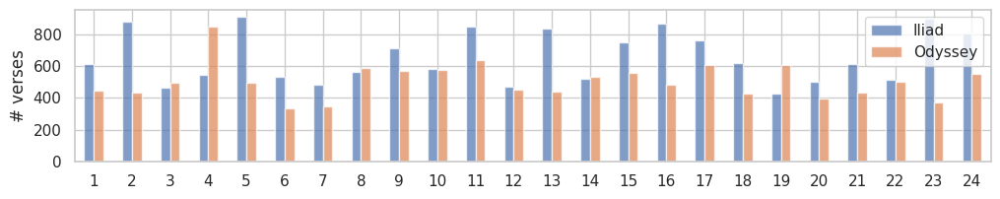

In [11]:
# the support
ax = pd.DataFrame({'Iliad':iliad_verses_pd.groupby('bid').text.apply(lambda x: len(x)),
                   'Odyssey': odyss_verses_pd.groupby('bid').text.apply(lambda x: len(x))}).plot.bar(alpha=0.7, rot=0, figsize=(12,2))
ax.set_xlabel(''); ax.set_ylabel('# verses');
ax.get_figure().savefig('verse_support.pdf', dpi=300, format='PDF')

In [12]:
word_len_odyss = np.mean([len(w) for w in " ".join(odyss_verses_pd.text.to_list()).split()])
word_len_iliad = np.mean([len(w) for w in " ".join(iliad_verses_pd.text.to_list()).split()])
print(f"#chars per word \n|Odyssey: {word_len_odyss:.2f}|\n|Iliad:   {word_len_iliad:.2f}|")

#chars per word 
|Odyssey: 5.04|
|Iliad:   5.08|


In [13]:
print(f"{odyss_verses_pd.text.str.split().apply(len).mean():.2f} words in Odyssey")
print(f"{iliad_verses_pd.text.str.split().apply(len).mean():.2f} words in Iliad")

7.20 words in Odyssey
7.13 words in Iliad


# Focusing on duplicates

In [14]:
iliad_verses_pd.text.value_counts()[:10]

καί μιν φωνήσας ἔπεα πτερόεντα προσηύδα:             15
οἳ δ᾽ ὅτε δὴ σχεδὸν ἦσαν ἐπ᾽ ἀλλήλοισιν ἰόντες       10
τὸν δ᾽ ἀπαμειβόμενος προσέφη πόδας ὠκὺς ἀχιλλεύς:     9
ὣς εἰπὼν ὄτρυνε μένος καὶ θυμὸν ἑκάστου               9
ἀτρεΐδη κύδιστε ἄναξ ἀνδρῶν ἀγάμεμνον                 8
τὸν δ᾽ ἠμείβετ᾽ ἔπειτα γερήνιος ἱππότα νέστωρ:        8
ὦ φίλοι ἀργείων ἡγήτορες ἠδὲ μέδοντες                 8
αὐτὰρ ἐπεὶ πόσιος καὶ ἐδητύος ἐξ ἔρον ἕντο            7
ὀχθήσας δ᾽ ἄρα εἶπε πρὸς ὃν μεγαλήτορα θυμόν:         7
στῆ δ᾽ ὀρθὸς καὶ μῦθον ἐν ἀργείοισιν ἔειπεν:          7
Name: text, dtype: int64

In [15]:
odyss_verses_pd.text.value_counts()[:10]

τὸν δ᾽ αὖ τηλέμαχος πεπνυμένος ἀντίον ηὔδα:          29
τὸν δ᾽ ἀπαμειβόμενος προσέφη πολύμητις ὀδυσσεύς:     21
ἦμος δ᾽ ἠριγένεια φάνη ῥοδοδάκτυλος ἠώς              20
καί μιν φωνήσας ἔπεα πτερόεντα προσηύδα:             15
ὣς ἔφατ᾽ αὐτὰρ ἐγώ μιν ἀμειβόμενος προσέειπον:       15
τὴν δ᾽ ἀπαμειβόμενος προσέφη πολύμητις ὀδυσσεύς:     15
αὐτὰρ ἐπεὶ πόσιος καὶ ἐδητύος ἐξ ἔρον ἕντο           14
τὸν δ᾽ αὖτε προσέειπε περίφρων πηνελόπεια:           13
τὴν δ᾽ αὖ τηλέμαχος πεπνυμένος ἀντίον ηὔδα:          13
οἱ δ᾽ ἐπ᾽ ὀνείαθ᾽ ἑτοῖμα προκείμενα χεῖρας ἴαλλον    11
Name: text, dtype: int64

* Using agglomerative clustering for near duplicates

In [16]:
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.feature_extraction.text import TfidfVectorizer

def aglo(data, data_col="text", label_col="text", threshold=1):
  vec = TfidfVectorizer()
  X = vec.fit_transform(data[data_col].values)
  Z = linkage(X.toarray(), 'ward')
  plt.figure(figsize=(8, 100))
  dendrogram(Z,
            orientation='right',
            labels=data[label_col].values,
            distance_sort='descending',
            show_leaf_counts=False,
            leaf_font_size=12.,
            show_contracted=True,
            )
  plt.show();
  return fcluster(Z, t=threshold, criterion='distance')

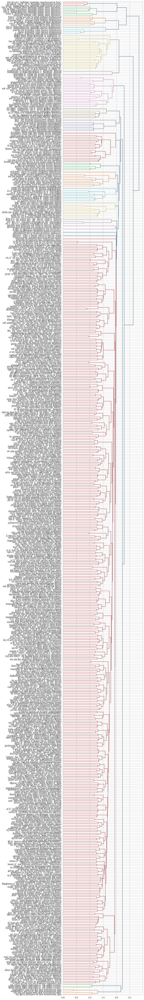

In [17]:
clustering = aglo(iliad_verses_pd[iliad_verses_pd.bid==1])

In [18]:
i1 = iliad_verses_pd[iliad_verses_pd.bid==1]
i1.insert(3, "dentro", clustering)

* Bringing tuples with near duplicates to study them

In [19]:
for i in range(1, max(clustering)):
  cluster = i1[i1.dentro==i]
  if cluster.shape[0]>1:
    print("-".join(cluster.vid.apply(str).to_list()), end=": ")
    print("||".join(cluster.text.to_list()))

511-517-560: ὣς φάτο: τὴν δ᾽ οὔ τι προσέφη νεφεληγερέτα ζεύς||τὴν δὲ μέγ᾽ ὀχθήσας προσέφη νεφεληγερέτα ζεύς:||τὴν δ᾽ ἀπαμειβόμενος προσέφη νεφεληγερέτα ζεύς:
84-215-364: τὸν δ᾽ ἀπαμειβόμενος προσέφη πόδας ὠκὺς ἀχιλλεύς:||τὴν δ᾽ ἀπαμειβόμενος προσέφη πόδας ὠκὺς ἀχιλλεύς:||τὴν δὲ βαρὺ στενάχων προσέφη πόδας ὠκὺς ἀχιλλεύς:
130-285: τὸν δ᾽ ἀπαμειβόμενος προσέφη κρείων ἀγαμέμνων:||τὸν δ᾽ ἀπαμειβόμενος προσέφη κρείων ἀγαμέμνων:
102-355-411: ἥρως ἀτρεΐδης εὐρὺ κρείων ἀγαμέμνων||ἦ γάρ μ᾽ ἀτρεΐδης εὐρὺ κρείων ἀγαμέμνων||γνῷ δὲ καὶ ἀτρεΐδης εὐρὺ κρείων ἀγαμέμνων
196-209: ἄμφω ὁμῶς θυμῷ φιλέουσά τε κηδομένη τε:||ἄμφω ὁμῶς θυμῷ φιλέουσά τε κηδομένη τε:
38-452: κίλλάν τε ζαθέην τενέδοιό τε ἶφι ἀνάσσεις||κίλλαν τε ζαθέην τενέδοιό τε ἶφι ἀνάσσεις:
13-372: λυσόμενός τε θύγατρα φέρων τ᾽ ἀπερείσι᾽ ἄποινα||λυσόμενός τε θύγατρα φέρων τ᾽ ἀπερείσι᾽ ἄποινα
23-377: αἰδεῖσθαί θ᾽ ἱερῆα καὶ ἀγλαὰ δέχθαι ἄποινα:||αἰδεῖσθαί θ᾽ ἱερῆα καὶ ἀγλαὰ δέχθαι ἄποινα:
12-371: ἀτρεΐδης: ὃ γὰρ ἦλθε θοὰς ἐπὶ νῆας ἀχαιῶν||ἦλθε θ

* Same for Odyssey (book 2)

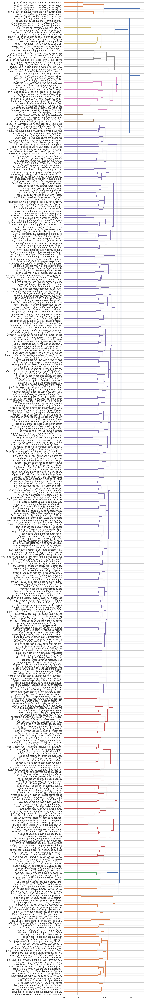

129-208-309-371: τὸν δ᾽ αὖ τηλέμαχος πεπνυμένος ἀντίον ηὔδα:||τὸν δ᾽ αὖ τηλέμαχος πεπνυμένος ἀντίον ηὔδα:||τὸν δ᾽ αὖ τηλέμαχος πεπνυμένος ἀντίον ηὔδα:||τὴν δ᾽ αὖ τηλέμαχος πεπνυμένος ἀντίον ηὔδα:
25-161-229: κέκλυτε δὴ νῦν μευ  ἰθακήσιοι ὅττι κεν εἴπω:||κέκλυτε δὴ νῦν μευ ἰθακήσιοι ὅττι κεν εἴπω:||κέκλυτε δὴ νῦν μευ ἰθακήσιοι ὅττι κεν εἴπω:
214-359: εἶμι γὰρ ἐς σπάρτην τε καὶ ἐς πύλον ἠμαθόεντα||εἶμι γὰρ ἐς σπάρτην τε καὶ ἐς πύλον ἠμαθόεντα
270-278: τηλέμαχ᾽ οὐδ᾽ ὄπιθεν κακὸς ἔσσεαι οὐδ᾽ ἀνοήμων||ἀλλ᾽ ἐπεὶ οὐδ᾽ ὄπιθεν κακὸς ἔσσεαι οὐδ᾽ ἀνοήμων
382-393: ἔνθ᾽ αὖτ᾽ ἄλλ᾽ ἐνόησε θεά γλαυκῶπις ἀθήνη||ἔνθ᾽ αὖτ᾽ ἄλλ᾽ ἐνόησε θεά γλαυκῶπις ἀθήνη
47-234: τοίσδεσσιν βασίλευε πατὴρ δ᾽ ὣς ἤπιος ἦεν:||λαῶν οἷσιν ἄνασσε πατὴρ δ᾽ ὣς ἤπιος ἦεν
215-264: νόστον πευσόμενος πατρὸς δὴν οἰχομένοιο||νόστον πευσόμενον πατρὸς δὴν οἰχομένοιο
30-42: ἠέ τιν᾽ ἀγγελίην στρατοῦ ἔκλυεν ἐρχομένοιο||οὔτε τιν᾽ ἀγγελίην στρατοῦ ἔκλυον ἐρχομένοιο
85-303: τηλέμαχ᾽ ὑψαγόρη  μένος ἄσχετε ποῖον ἔειπες||τηλέμαχ᾽ ὑψαγόρη μένος ἄσ

In [20]:
o2 = odyss_verses_pd[odyss_verses_pd.bid==2]
o2.insert(3, "dentro", aglo(odyss_verses_pd[odyss_verses_pd.bid==2]))
for i in range(1, max(clustering)):
  cluster = o2[o2.dentro==i]
  if cluster.shape[0]>1:
    print("-".join(cluster.vid.apply(str).to_list()), end=": ")
    print("||".join(cluster.text.to_list()))

## Statistical language modelling

Perplexity (PPL) as described by [Pavlopoulos & Konstantinidou (2022)](https://link.springer.com/article/10.1007/s42803-022-00046-7), with the average number of characters per word weighing BPC ([code](https://github.com/ipavlopoulos/compauth/blob/main/analysing_iliad_and_odyssey.ipynb)).

In [21]:
ppl_adj = lambda lm, text, f=5: np.power(2, f*lm.cross_entropy(text))

The methodology comprises the cyclic development of 24 models per poem, each build on the text of the rest 23 books. The verses of the left-out book are scored by this model.

In [22]:
poems = {"iliad": iliad_verses_pd, "odyssey": odyss_verses_pd}
models = {"iliad":{}, "odyssey":{}}

In [23]:
# computing the 24 Iliad and Odyssey language models
for name in poems:
  poem = poems[name]
  for i in range(1,25):
    train_data = "\n".join(poem[poem.bid!=i].text.to_list())
    model = SLM(gram="CHAR").train(train_data)
    models[name][i] = model

Measuring the PPL per verse when the model is trained on the verses of the rest of the books.

In [24]:
ppls = {"iliad":[], "odyssey":[]}
for name in poems: # for each poem
    poem = poems[name]
    for book_id in range(1,25):
        book = poem[poem.bid==book_id] # for each book
        model = models[name][book_id] # and model trained on **all but** this book
        for t,_,_,_ in book.to_numpy():
            ppls[name].append(ppl_adj(model, t+"\n")) # compute the PPL per book verse
    poem["ppl"] = ppls[name]

* Iliad

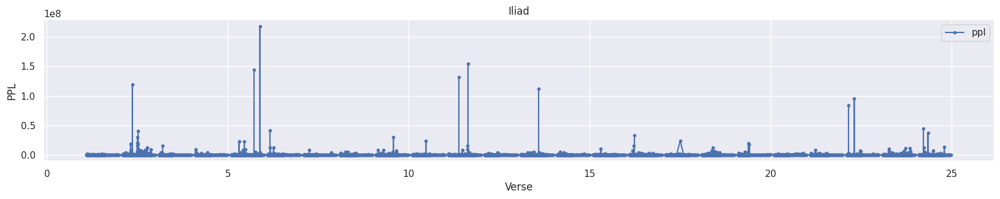

In [25]:
sns.set(rc={'figure.figsize':(20,3)})
ax = poems["iliad"].plot(marker=".", y="ppl", x="uid", title="Iliad");
ax.set_xlabel("Verse"); ax.set_ylabel("PPL");

In [26]:
poems["iliad"].sort_values(by="ppl", ascending=False)

,text,vid,bid,uid,ppl
3379,ἤ κε ζὼς ἀμενηνὸς ἔα χαλκοῖο τυπῇσι,887,5,5.887,2.182228e+08
6899,οἴνῳ πραμνείῳ ἐπὶ δ᾽ αἴγειον κνῆ τυρὸν,638,11,11.638,1.546172e+08
3215,χάλκεα ὀκτάκνημα σιδηρέῳ ἄξονι ἀμφίς,723,5,5.723,1.437058e+08
6646,τοξότα λωβητὴρ κέρᾳ ἀγλαὲ παρθενοπῖπα,385,11,11.385,1.319857e+08
973,ὡς φρήτρη φρήτρηφιν ἀρήγῃ φῦλα δὲ φύλοις,363,2,2.363,1.193850e+08
...,...,...,...,...,...
14942,τὴν δ᾽ ἀπαμειβόμενος προσέφη νεφεληγερέτα ζεύς:,64,24,24.640,5.928132e+01
12371,τὸν δ᾽ ἀπαμειβόμενος προσέφη νεφεληγερέτα ζεύς:,19,20,20.190,5.893447e+01
2936,μῆνιν ἀλευάμενος ἑκατηβόλου ἀπόλλωνος,444,5,5.444,4.792384e+01
10394,μῆνιν ἀλευάμενος ἑκατηβόλου ἀπόλλωνος,711,16,16.711,4.596906e+01


* Odyssey:

In [27]:
# an outlier harms visualisation, working on a copy instead
ody_copy = poems["odyssey"]
ody_copy.loc[4779, 'ppl'] = 0

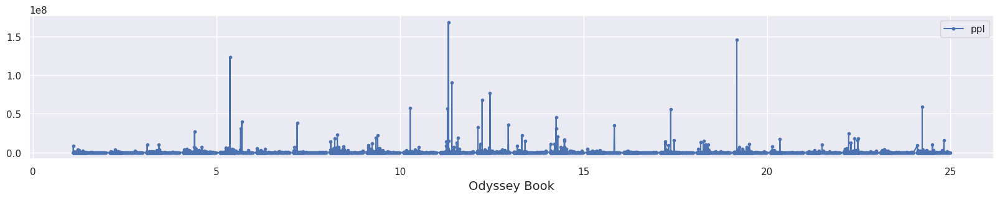

In [28]:
ax = ody_copy.sort_values(by='uid').plot(marker=".", y="ppl", x="uid");
plt.xlabel('Odyssey Book', fontsize=14)
ax.get_figure().savefig('odyss_ppl.pdf', dpi=300, format='PDF')

In [29]:
ody_copy.sort_values(by="ppl", ascending=False)[:10]

,text,vid,bid,uid,ppl
5437,ἀνθῆσαι πυκάσαι τε γένυς ἐυανθέι λάχνῃ,320,11,11.320,1.685804e+08
9431,δωριέες τε τριχάϊκες δῖοί τε πελασγοί,177,19,19.177,1.457510e+08
2589,ὡς δ᾽ ἄνεμος ζαὴς ἠΐων θημῶνα τινάξῃ,368,5,5.368,1.231455e+08
5532,ἢ γάμῳ ἢ ἐράνῳ ἢ εἰλαπίνῃ τεθαλυίῃ,415,11,11.415,9.087849e+07
6210,αὖτις ἀριζήλως εἰρημένα μυθολογεύειν,453,12,12.453,7.687241e+07
5995,πᾶσ᾽ ἀναμορμύρεσκε κυκωμένη ὑψόσε δ᾽ ἄχνη,238,12,12.238,6.765539e+07
11787,κνημῖδας ῥαπτὰς δέδετο γραπτῦς ἀλεείνων,229,24,24.229,5.939700e+07
4823,πρῶτον ὑπηνήτῃ τοῦ περ χαριεστάτη ἥβη:,279,10,10.279,5.722777e+07
5418,τοὺς ἄμφω ζωοὺς κατέχει φυσίζοος αἶα:,301,11,11.301,5.716627e+07
8597,πτωχοὶ ἀνιηροί δαιτῶν ἀπολυμαντῆρες;,377,17,17.377,5.632614e+07


Studying high-PPL (peaks) verses:

In [30]:
for name in poems:
  poem = poems[name]
  print(f"{name.upper()} {poem[poem.ppl==poem.ppl.max()][['text','uid']]}")

ILIAD                                      text    uid
3379  ἤ κε ζὼς ἀμενηνὸς ἔα χαλκοῖο τυπῇσι  5.887
ODYSSEY                                         text    uid
5437  ἀνθῆσαι πυκάσαι τε γένυς ἐυανθέι λάχνῃ  11.32


In [31]:
# number of verses
poems['iliad'].shape[0] + poems['odyssey'].shape[0]

27790

In [32]:
# Verifying that it is not a missing character that does the damage.
set("οἴνῳ πραμνείῳ ἐκύκα: ἀνέμισγε δὲ σίτῳ") - set(" ".join(poems["odyssey"][poems["odyssey"].bid!=10].text.to_list()))

set()

# Correlation between PPL and word-uniqueness

* Studying the relationship between the PPL and the (inverse) document frequency at the verse level.
* Computing the min/max/avg per verse.

In [34]:
# get the min, max, mean document frequencies for a text's words
def get_df(txt, vec, df):
    words = vec.build_tokenizer()(txt)
    df_scores = [df[w] for w in words]
    idf_pd = pd.DataFrame({'word':words, 'IDF':df_scores})
    return idf_pd

* Iliad

In [35]:
poem = poems["iliad"]
# compute word IDF then map verse words to their IDFs
vec_i = TfidfVectorizer().fit(poem.text.values);
df_i = dict(zip(vec_i.get_feature_names_out(), vec_i.idf_))
# testing
print(vec_i.build_tokenizer()(poem.text.iloc[0]))
first_verse_idfs = get_df(poem.text.iloc[0], vec_i, df_i)
print(first_verse_idfs.IDF.agg(["min", "max", "mean"]))
first_verse_idfs

['μῆνιν', 'ἄειδε', 'θεὰ', 'πηληϊάδεω', 'ἀχιλῆος']
min     6.383730
max     9.274102
mean    7.954383
Name: IDF, dtype: float64


,word,IDF
0,μῆνιν,8.357811
1,ἄειδε,9.274102
2,θεὰ,6.383730
3,πηληϊάδεω,8.463172
4,ἀχιλῆος,7.293101


In [ ]:
# setting up the dataframe (ppl, min_df, max_df, avg_df)
ablation_i = pd.DataFrame(list(poem.text.apply(lambda x: get_df(x, vec_i, df_i).IDF.agg(["min", "max", "mean"]).values)),
                          columns=("IDF-min", "IDF-max", "IDF-avg"))
ablation_i.insert(0, "PPL", poem.ppl)
# drawing
sns.set_theme(style="white")
mask = np.zeros_like(ablation_i.corr(), dtype=bool) # Generating a mask for the upper triangle
mask[np.triu_indices_from(mask)] = True
cmap = sns.diverging_palette(220, 10, as_cmap=True) # Generating a custom diverging colormap

              PPL   IDF-min   IDF-max   IDF-avg
PPL      1.000000  0.044255  0.664632  0.412680
IDF-min  0.044255  1.000000  0.058268  0.600922
IDF-max  0.664632  0.058268  1.000000  0.419328
IDF-avg  0.412680  0.600922  0.419328  1.000000


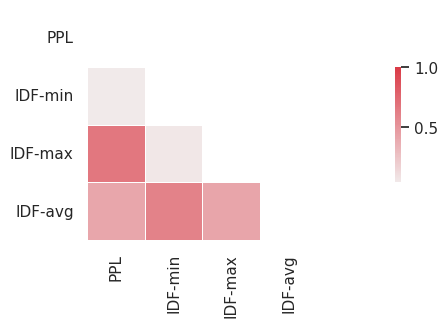

In [43]:
print(ablation_i.corr('spearman'))
sns.heatmap(ablation_i.corr('spearman'), mask=mask, cmap=cmap, vmax=1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5});

* Same for Pearson:

              PPL   IDF-min   IDF-max   IDF-avg
PPL      1.000000  0.047323  0.040075  0.089395
IDF-min  0.047323  1.000000  0.067132  0.672106
IDF-max  0.040075  0.067132  1.000000  0.453010
IDF-avg  0.089395  0.672106  0.453010  1.000000


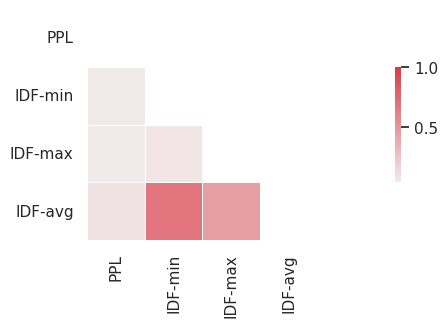

In [44]:
print(ablation_i.corr())
sns.heatmap(ablation_i.corr(), mask=mask, cmap=cmap, vmax=1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5});

* When applying a log, the linear relationship appears (smoothed the outliers?)

In [73]:
print(ablation_i.apply(np.log).corr())

              PPL   IDF-min   IDF-max   IDF-avg
PPL      1.000000  0.054850  0.581791  0.432295
IDF-min  0.054850  1.000000  0.054968  0.625125
IDF-max  0.581791  0.054968  1.000000  0.466724
IDF-avg  0.432295  0.625125  0.466724  1.000000


In [37]:
poems["iliad"]["idf"] = ablation_i["IDF-min"]
poems["iliad"]["idf_avg"] = ablation_i["IDF-avg"]

* Odyssey:

In [38]:
poem = poems["odyssey"]
vec_o = TfidfVectorizer().fit(poem.text.values);
df_o = dict(zip(vec_o.get_feature_names_out(), vec_o.idf_))
# testing
print(vec_o.build_tokenizer()(poem.text.iloc[0]))
first_verse_idfs = get_df(poem.text.iloc[0], vec_o, df_o)
print(first_verse_idfs.IDF.agg(["min", "max", "mean"]))
first_verse_idfs

['ἄνδρα', 'μοι', 'ἔννεπε', 'μοῦσα', 'πολύτροπον', 'ὃς', 'μάλα', 'πολλὰ']
min     4.347182
max     9.708474
mean    7.101521
Name: IDF, dtype: float64


,word,IDF
0,ἄνδρα,6.905114
1,μοι,4.347182
2,ἔννεπε,9.708474
3,μοῦσα,9.303009
4,πολύτροπον,9.708474
5,ὃς,5.924285
6,μάλα,5.358197
7,πολλὰ,5.557435


In [ ]:
ablation_o = pd.DataFrame(list(poem.text.apply(lambda x: get_df(x, vec_o, df_o).IDF.agg(["min", "max", "mean"]).values)),
                          columns=("min", "max", "avg"))
ablation_o.insert(0, "ppl", poem.ppl)
# drawing
mask = np.zeros_like(ablation_o.corr(), dtype=bool) # Generating a mask for the upper triangle
mask[np.triu_indices_from(mask)] = True
cmap = sns.diverging_palette(220, 10, as_cmap=True) # Generating a custom diverging colormap
poems["odyssey"]["idf"] = ablation_o["min"]
poems["odyssey"]["idf_avg"] = ablation_o["avg"]

          ppl       min       max       avg
ppl  1.000000  0.012648  0.700216  0.434785
min  0.012648  1.000000  0.025867  0.548828
max  0.700216  0.025867  1.000000  0.437890
avg  0.434785  0.548828  0.437890  1.000000


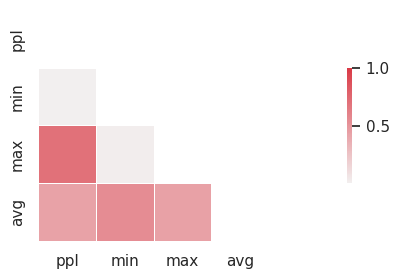

In [41]:
print(ablation_o.corr('spearman'))
sns.heatmap(ablation_o.corr('spearman'), mask=mask, cmap=cmap, vmax=1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5});

* Same for Pearson:

          ppl       min       max       avg
ppl  1.000000  0.047987  0.053463  0.114490
min  0.047987  1.000000  0.021191  0.639473
max  0.053463  0.021191  1.000000  0.471411
avg  0.114490  0.639473  0.471411  1.000000


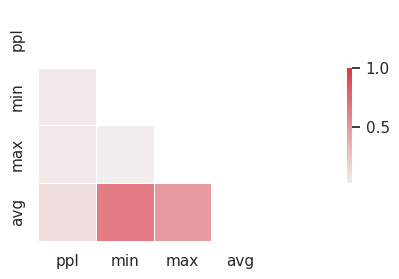

In [42]:
print(ablation_o.corr())
sns.heatmap(ablation_o.corr(), mask=mask, cmap=cmap, vmax=1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5});

# Combining the PPLs from the Iliadic and the Odyssey model

In [45]:
train_data = "\n".join(poems["iliad"].text.explode().to_list())
iliad_model = SLM(gram="CHAR").train(train_data)
train_data = "\n".join(poems["odyssey"].text.explode().to_list())
odyssey_model = SLM(gram="CHAR").train(train_data)

In [46]:
cross_score = lambda t, m1, m2: ppl_adj(m1, t+"\n")-ppl_adj(m2, t+"\n")
csi = poems["iliad"].text.apply(lambda t: cross_score(t, odyssey_model, iliad_model)) # o-i (greater is better)
poems["iliad"]["cross_score"] =csi

In [47]:
cso = poems["odyssey"].text.apply(lambda t: cross_score(t, iliad_model, odyssey_model)) # o-i
poems["odyssey"]["cross_score"] = cso

* Computing the PPL of an Iliadic LM on Odyssey verses, and vise versa

In [48]:
poems["iliad"]['odyssey_ppl'] = poems["iliad"].text.apply(lambda t: ppl_adj(odyssey_model, t+"\n"))
poems["odyssey"]['iliad_ppl'] = poems["odyssey"].text.apply(lambda t: ppl_adj(iliad_model, t+"\n"))

#### Interpreting the cross score
* lower cross-score means closer to the poem's spirit, higher means closer to the other
* this is also shown by comparing PPL (the official) with that of 'the other' poem (trained on all the verses)

In [49]:
poems["odyssey"].head()

,text,vid,bid,uid,ppl,idf,idf_avg,cross_score,iliad_ppl
0,ἄνδρα μοι ἔννεπε μοῦσα πολύτροπον ὃς μάλα πολλὰ,1,1,1.1,88463.246367,4.347182,7.101521,12889.732005,13193.933754
1,πλάγχθη ἐπεὶ τροίης ἱερὸν πτολίεθρον ἔπερσεν:,2,1,1.2,36741.903809,4.649049,8.047691,2297.115614,4093.028059
2,πολλῶν δ᾽ ἀνθρώπων ἴδεν ἄστεα καὶ νόον ἔγνω,3,1,1.3,9337.848998,2.743394,7.079644,4087.901105,6553.602503
3,πολλὰ δ᾽ ὅ γ᾽ ἐν πόντῳ πάθεν ἄλγεα ὃν κατὰ θυμόν,4,1,1.4,1322.326622,3.983257,6.363259,8574.418458,9495.433700
4,ἀρνύμενος ἥν τε ψυχὴν καὶ νόστον ἑταίρων,5,1,1.5,2677.224514,2.743394,6.658610,1308.569429,2246.205464


In [ ]:
#@title Download the recognised name entities per poem
#@markdown You will be asked to enter two IDs (same as before)
from ast import literal_eval
iliad_nered = input('Enter the ID of the NERed Iliad: ')
odyss_nered = input('Enter the ID of the NERed Odyssey: ')
!gdown "$iliad_nered"
!gdown "$odyss_nered"

In [52]:
import re
def extract_names(text, rec_type='PER'):
  assert rec_type in {'PER', 'LOC'}
  recognitions = text.split(',')
  pattern = r'"[^"]*"'
  results = []
  for text in recognitions:
    if rec_type in text:
      matches = re.findall(pattern, text)
      if len(matches)>0:
        results.append(matches[0])
  return results

In [53]:
persons_iliad = pd.read_csv('iliad_ner.csv')['ne'].apply(lambda x: extract_names(x, 'PER'))
persons_odyss = pd.read_csv('odyss_ner.csv')['ne'].apply(lambda x: extract_names(x, 'PER'))

In [54]:
locations_iliad = pd.read_csv('iliad_ner.csv')['ne'].apply(lambda x: extract_names(x, 'LOC'))
locations_odyss = pd.read_csv('odyss_ner.csv')['ne'].apply(lambda x: extract_names(x, 'LOC'))

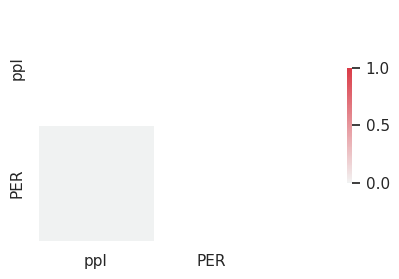

In [58]:
# assessing the correlation between DF and PPL for Odyssey
cor = pd.DataFrame({'ppl': poems["iliad"]["ppl"], 'PER': persons_iliad.apply(len)}).corr()
mask = np.zeros_like(cor, dtype=bool) # Generating a mask for the upper triangle
mask[np.triu_indices_from(mask)] = True
cmap = sns.diverging_palette(220, 10, as_cmap=True) # Generating a custom diverging colormap
sns.heatmap(cor, mask=mask, cmap=cmap, vmax=1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5});

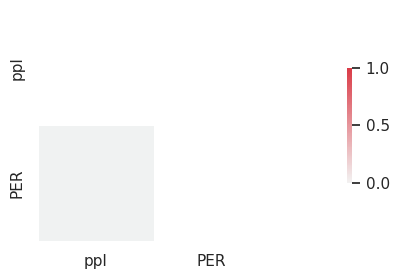

In [60]:
# assessing the correlation between DF and PPL for Odyssey
cor = pd.DataFrame({'ppl': poems["odyssey"]["ppl"], 'PER': persons_odyss.apply(len)}).corr()
mask = np.zeros_like(cor, dtype=bool) # Generating a mask for the upper triangle
mask[np.triu_indices_from(mask)] = True
cmap = sns.diverging_palette(220, 10, as_cmap=True) # Generating a custom diverging colormap
sns.heatmap(cor, mask=mask, cmap=cmap, vmax=1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5});

### Correlation study

In [61]:
# computing the new 24 Iliad and Odyssey language models
models = {"iliad":{}, "odyssey":{}}
for name in poems:
  poem = poems[name]
  for i in range(1,25):
    train_data = "\n".join(poem[poem.bid==i].text.to_list())
    model = SLM(gram="CHAR").train(train_data)
    models[name][i] = model

In [62]:
ppls = {"iliad":[], "odyssey":[]}
for name in poems: # for each poem
  poem = poems[name]
  for book_id in range(1,25):
    model = models[name][book_id] # one model (trained) per book
    ppls[name].append([ppl_adj(model, t+"\n") for t in poem.text.to_list()]) # PPL per verse per book-model

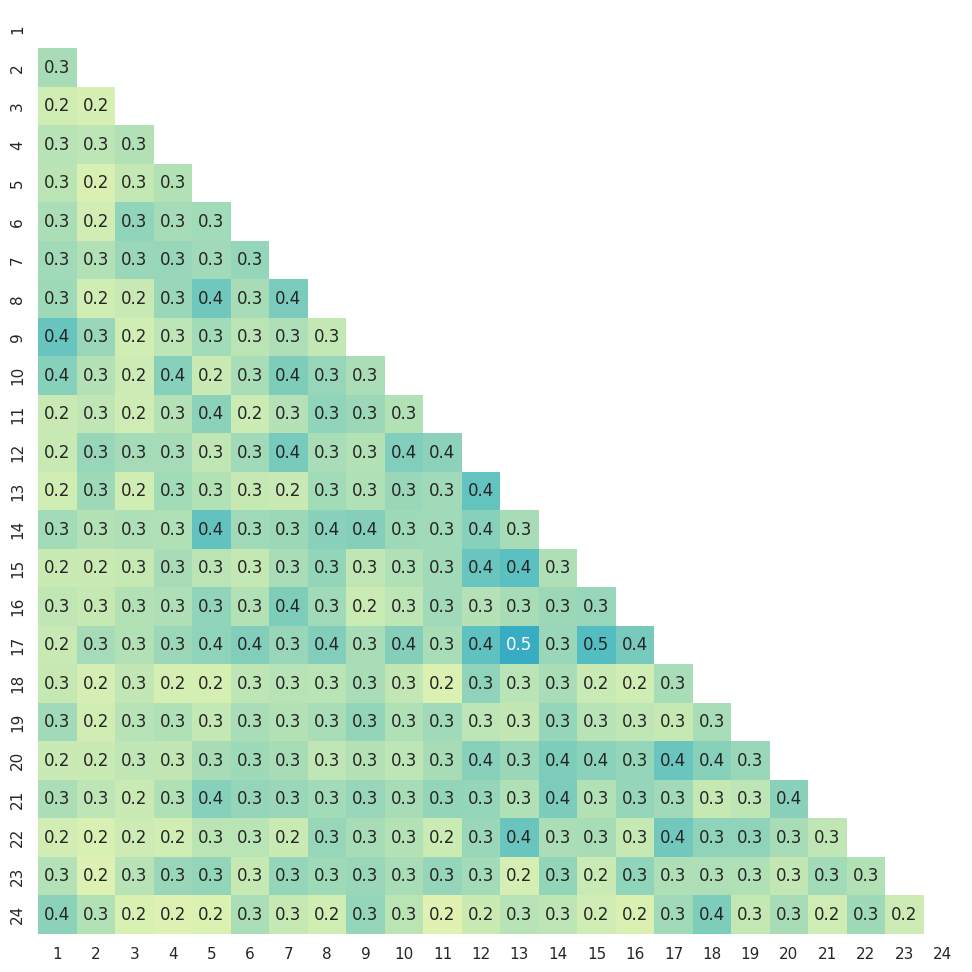

In [63]:
# ILIAD
corr = pd.DataFrame(dict(zip(list(range(1,25)), ppls["iliad"]))).corr()
sns.set(rc={'figure.figsize':(12,12)})
mask = np.zeros_like(corr); mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
  sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, vmin=0,
              vmax=1, annot=True, fmt=".1f", cmap="YlGnBu", mask=mask, square=True, cbar=False);

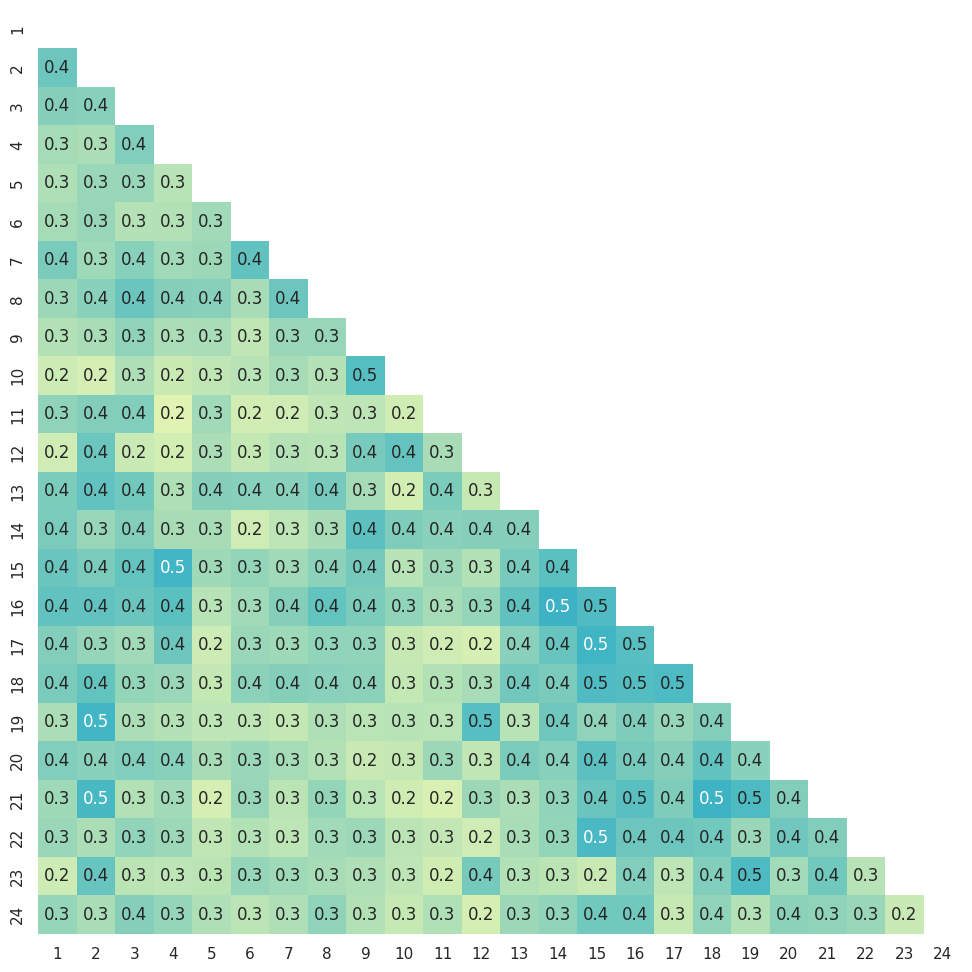

In [64]:
# Odyssey
corr = pd.DataFrame(dict(zip(list(range(1,25)), ppls["odyssey"]))).corr()
sns.set(rc={'figure.figsize':(12,12)})
mask = np.zeros_like(corr); mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
  sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, vmin=0,
              vmax=1, annot=True, fmt=".1f", cmap="YlGnBu", mask=mask, square=True, cbar=False);

### Investigating repeated verses

In [65]:
iliad_duplct = iliad_verses_pd[iliad_verses_pd.duplicated(subset="text")]
iliad_duplct_not = iliad_verses_pd[~iliad_verses_pd.duplicated(subset="text")]
odyss_duplct = odyss_verses_pd[odyss_verses_pd.duplicated(subset="text")]
odyss_duplct_not = odyss_verses_pd[~odyss_verses_pd.duplicated(subset="text")]
print(f"{iliad_duplct.shape[0]} verses are duplicated in Iliad and {odyss_duplct.shape[0]} in Odyssey.")
print(f"That is {100*iliad_duplct.shape[0]/iliad_verses_pd.shape[0]:.2f}% in Iliad and {100*odyss_duplct.shape[0]/odyss_verses_pd.shape[0]:.2f}% in Odyssey.")
#1008 verses are duplicated in Iliad and 1035 in Odyssey.
#That is 6.43% in Iliad and 8.55% in Odyssey.

1022 verses are duplicated in Iliad and 1043 in Odyssey.
That is 6.52% in Iliad and 8.61% in Odyssey.


Building models on non-repeated verses, from the first part of each poem. Then using them to score text from repeated and non-repeated verses. The first yields lower PPL, despite the fact that the models were trained on non-repeated verses.

In [66]:
iliad_cnt_lm = SLM(gram="CHAR").train("\n".join(iliad_duplct_not.iloc[:6000].text.values))
odyss_cnt_lm = SLM(gram="CHAR").train("\n".join(odyss_duplct_not.iloc[:6000].text.values))

In [67]:
sample_size, repetitions = 30, 300
# sample repeated (RV) and not repeated (NRV) verses and compare their mean PPL
for name, rv, nrv, model in (("Iliad", iliad_duplct, iliad_duplct_not.iloc[6000:], iliad_cnt_lm), ("Odyssey", odyss_duplct, odyss_duplct_not.iloc[6000:], odyss_cnt_lm)):
  bootstrap = []
  for i in range(300):
    bootstrap.append(rv.sample(30).text.apply(model.ppl).mean() > nrv.sample(30).text.apply(model.ppl).mean())
  print(f"[{name}] P value: {np.mean(bootstrap)}")

[Iliad] P value: 0.0
[Odyssey] P value: 0.0


Visualising the position of the repeated verses


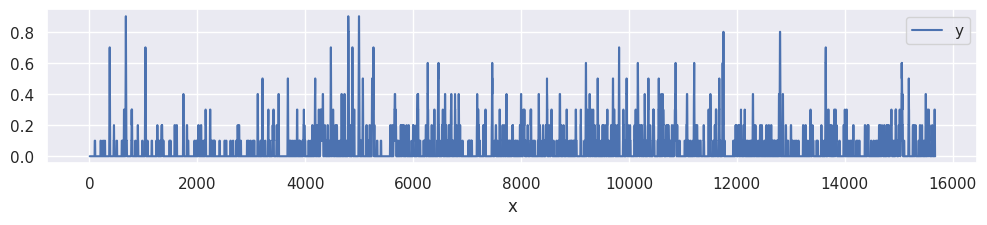

In [68]:
# iliad
duplicates = set(iliad_duplct.index.to_list())
x = range(iliad_verses_pd.shape[0])
y = [1 if i in duplicates else 0 for i in x]
pd.DataFrame({"x":x, "y":y}).rolling(10).mean().plot(x="x", figsize=(12,2));

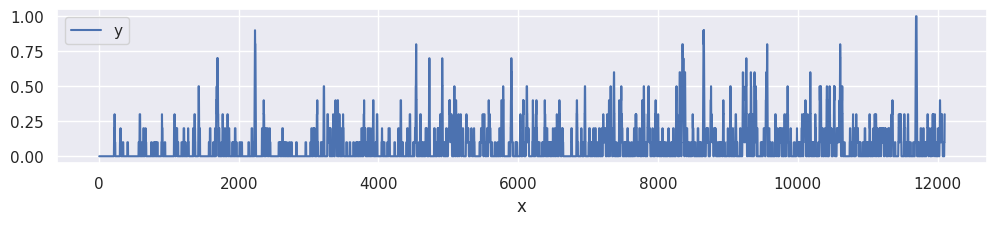

In [69]:
# odyssey
duplicates = set(odyss_duplct.index.to_list())
x = range(odyss_verses_pd.shape[0])
y = [1 if i in duplicates else 0 for i in x]
pd.DataFrame({"x":x, "y":y}).rolling(10).mean().plot(x="x", figsize=(12,2));

Exploring the most frequent ones

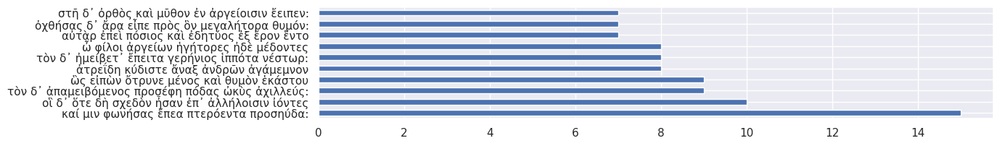

In [70]:
iliad_verses_pd.text.value_counts(ascending=False)[:10].plot.barh(figsize=(12,2));

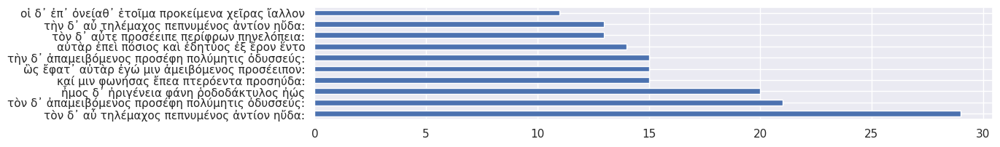

In [71]:
odyss_verses_pd.text.value_counts(ascending=False)[:10].plot.barh(figsize=(12,2));

To explore [Quintus](https://www.perseus.tufts.edu/hopper/text?doc=Perseus%3Atext%3A2008.01.0490) and [Augusta](https://en.wikipedia.org/wiki/Aelia_Eudocia)...